Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import  accuracy_score,classification_report,ConfusionMatrixDisplay
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

Import the Dataset

In [5]:
#import dataset
df1 = pd.read_csv("modis_2021_india.csv.csv")
df2 = pd.read_csv("modis_2022_india.csv.csv")
df3 = pd.read_csv("modis_2023_india.csv.csv")

In [7]:
df1.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,28.0993,96.9983,303.0,1.1,1.1,2021-01-01,409,Terra,MODIS,44.0,6.03,292.6,8.6,D,0.0
1,30.0420,79.6492,301.8,1.4,1.2,2021-01-01,547,Terra,MODIS,37.0,6.03,287.4,9.0,D,0.0
2,30.0879,78.8579,300.2,1.3,1.1,2021-01-01,547,Terra,MODIS,8.0,6.03,286.5,5.4,D,0.0
3,30.0408,80.0501,302.0,1.5,1.2,2021-01-01,547,Terra,MODIS,46.0,6.03,287.7,10.7,D,0.0
4,30.6565,78.9668,300.9,1.3,1.1,2021-01-01,547,Terra,MODIS,43.0,6.03,287.6,9.0,D,0.0


In [8]:
df2.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,30.1138,80.0756,300.0,1.2,1.1,2022-01-01,511,Terra,MODIS,7,6.03,288.4,7.1,D,0.0
1,23.7726,86.2078,306.1,1.6,1.2,2022-01-01,512,Terra,MODIS,62,6.03,293.5,10.4,D,2.0
2,22.2080,84.8627,304.8,1.4,1.2,2022-01-01,512,Terra,MODIS,42,6.03,293.3,5.8,D,2.0
3,23.7621,86.3946,306.9,1.6,1.2,2022-01-01,512,Terra,MODIS,38,6.03,295.2,9.3,D,2.0
4,23.6787,86.0891,303.6,1.5,1.2,2022-01-01,512,Terra,MODIS,52,6.03,293.1,7.2,D,2.0


In [9]:
df3.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,9.3280,77.6247,318.0,1.1,1.0,2023-01-01,821,Aqua,MODIS,62,61.03,305.0,7.6,D,0.0
1,10.4797,77.9378,313.8,1.0,1.0,2023-01-01,822,Aqua,MODIS,58,61.03,299.4,4.3,D,0.0
2,13.2478,77.2639,314.7,1.0,1.0,2023-01-01,822,Aqua,MODIS,55,61.03,302.4,4.9,D,0.0
3,12.2994,78.4085,314.3,1.0,1.0,2023-01-01,822,Aqua,MODIS,58,61.03,301.9,4.8,D,0.0
4,14.1723,75.5024,338.4,1.2,1.1,2023-01-01,823,Aqua,MODIS,88,61.03,305.3,41.5,D,0.0


In [10]:
df = pd.concat([df1, df2, df3], ignore_index=True)

In [11]:
df.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,28.0993,96.9983,303.0,1.1,1.1,2021-01-01,409,Terra,MODIS,44.0,6.03,292.6,8.6,D,0.0
1,30.0420,79.6492,301.8,1.4,1.2,2021-01-01,547,Terra,MODIS,37.0,6.03,287.4,9.0,D,0.0
2,30.0879,78.8579,300.2,1.3,1.1,2021-01-01,547,Terra,MODIS,8.0,6.03,286.5,5.4,D,0.0
3,30.0408,80.0501,302.0,1.5,1.2,2021-01-01,547,Terra,MODIS,46.0,6.03,287.7,10.7,D,0.0
4,30.6565,78.9668,300.9,1.3,1.1,2021-01-01,547,Terra,MODIS,43.0,6.03,287.6,9.0,D,0.0


In [14]:
df.shape

(80513, 15)

In [21]:
df.isnull().sum()

,0
latitude,0
longitude,0
brightness,0
scan,0
track,0
acq_date,0
acq_time,0
satellite,1
instrument,1
confidence,1


In [24]:
df_clean=df.dropna()

In [28]:
df_clean.duplicated().sum()

np.int64(0)

In [29]:
df_clean.describe()

,latitude,longitude,brightness,scan,track,acq_time,confidence,version,bright_t31,frp,type
count,80510.000000,80510.000000,80510.000000,80510.000000,80510.000000,80510.000000,80510.000000,80510.000000,80510.000000,80510.000000,80510.000000
mean,21.286196,83.353565,322.803351,1.458138,1.164217,802.402546,63.692138,24.226249,302.652530,34.691479,0.093765
std,4.472641,7.075051,15.361267,0.666829,0.211888,348.600351,18.362122,25.878534,7.780724,118.269560,0.422820
min,8.190300,68.538400,300.000000,1.000000,1.000000,321.000000,0.000000,6.030000,267.400000,0.000000,0.000000
25%,18.171900,77.614225,314.000000,1.000000,1.000000,637.000000,53.000000,6.030000,297.100000,8.600000,0.000000
50%,21.770200,82.122700,321.200000,1.200000,1.100000,738.000000,65.000000,6.030000,303.100000,13.300000,0.000000
75%,24.438575,91.865125,327.800000,1.600000,1.200000,815.000000,75.000000,61.030000,308.500000,25.500000,0.000000
max,34.499500,97.104400,503.900000,4.800000,2.000000,2139.000000,100.000000,61.030000,400.100000,6961.800000,3.000000


In [30]:
# Check Unique values of target variable
df_clean.type.value_counts()

,count
type,
0.0,76736
2.0,3773
3.0,1


In [32]:
# Remove the row where 'type' is 3.0
df_clean = df_clean[df_clean['type'] != 3.0]

# Verify that the anomaly has been removed
df_clean.type.value_counts()

,count
type,
0.0,76736
2.0,3773


Exploratory Data Analysis

In [33]:
# Check unique and n unique for all categorical features
for col in df_clean.columns:
  if df_clean[col].dtype == 'object':
    print(f"Column: {col}")
    print(f"Unique values: {df_clean[col].unique()}")
    print(f"Number of unique values: {df_clean[col].nunique()}")
    print("-" * 50)

Column: acq_date
Unique values: ['2021-01-01' '2021-01-02' '2021-01-03' '2021-01-04' '2021-01-05'
 '2021-01-06' '2021-01-07' '2021-01-08' '2021-01-09' '2021-01-10'
 '2021-01-11' '2021-01-12' '2021-01-13' '2021-01-14' '2021-01-15'
 '2021-01-16' '2021-01-17' '2021-01-18' '2021-01-19' '2021-01-20'
 '2021-01-21' '2021-01-22' '2021-01-23' '2021-01-24' '2021-01-25'
 '2021-01-26' '2021-01-27' '2021-01-28' '2021-01-29' '2021-01-30'
 '2021-01-31' '2021-02-01' '2021-02-02' '2021-02-03' '2021-02-04'
 '2021-02-05' '2021-02-06' '2021-02-07' '2021-02-08' '2021-02-09'
 '2021-02-10' '2021-02-11' '2021-02-12' '2021-02-13' '2021-02-14'
 '2021-02-15' '2021-02-16' '2021-02-17' '2021-02-18' '2021-02-19'
 '2021-02-20' '2021-02-21' '2021-02-22' '2021-02-23' '2021-02-24'
 '2021-02-25' '2021-02-26' '2021-02-27' '2021-02-28' '2021-03-01'
 '2021-03-02' '2021-03-03' '2021-03-04' '2021-03-05' '2021-03-06'
 '2021-03-07' '2021-03-08' '2021-03-09' '2021-03-10' '2021-03-11'
 '2021-03-12' '2021-03-13' '2022-01-01' '202

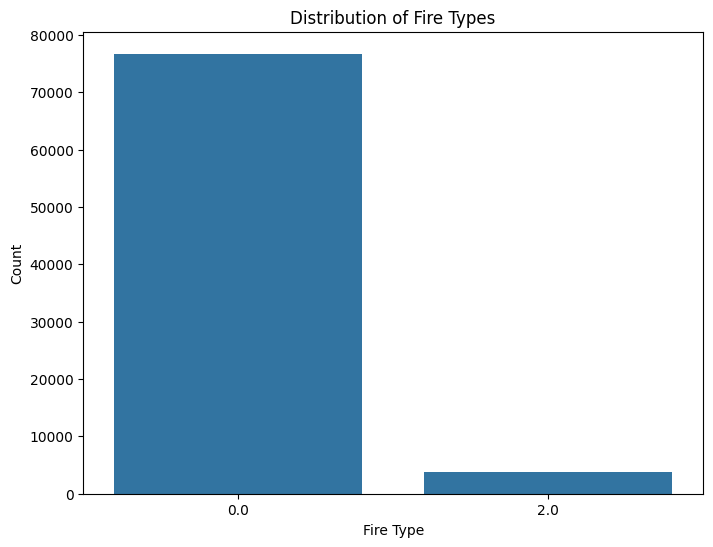

In [37]:
# Count plot for 'type'
plt.figure(figsize=(8, 6))
sns.countplot(x='type', data=df_clean)
plt.title('Distribution of Fire Types')
plt.xlabel('Fire Type')
plt.ylabel('Count')
plt.show()

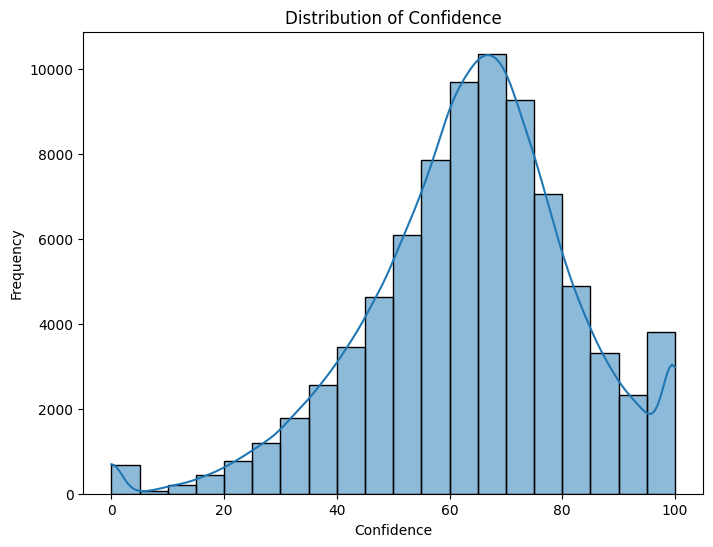

In [38]:
# Histogram of 'confidence'
plt.figure(figsize=(8, 6))
sns.histplot(df_clean['confidence'], bins=20, kde=True)
plt.title('Distribution of Confidence')
plt.xlabel('Confidence')
plt.ylabel('Frequency')
plt.show()

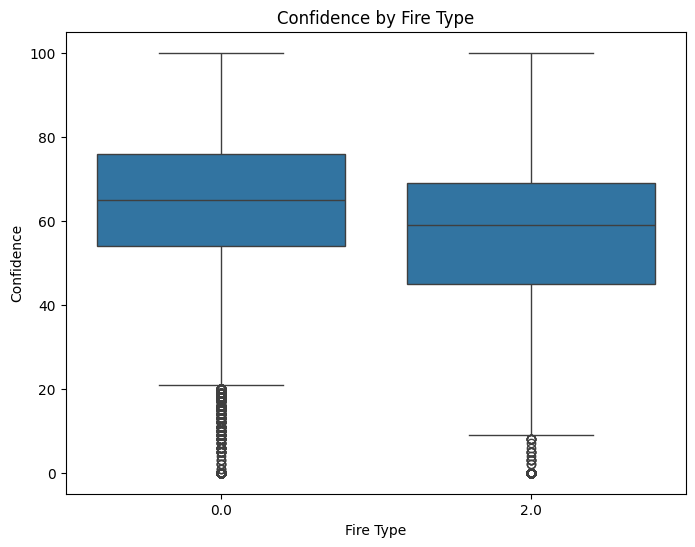

In [39]:
# Box plot for 'confidence' by 'type'
plt.figure(figsize=(8, 6))
sns.boxplot(x='type', y='confidence', data=df_clean)
plt.title('Confidence by Fire Type')
plt.xlabel('Fire Type')
plt.ylabel('Confidence')
plt.show()

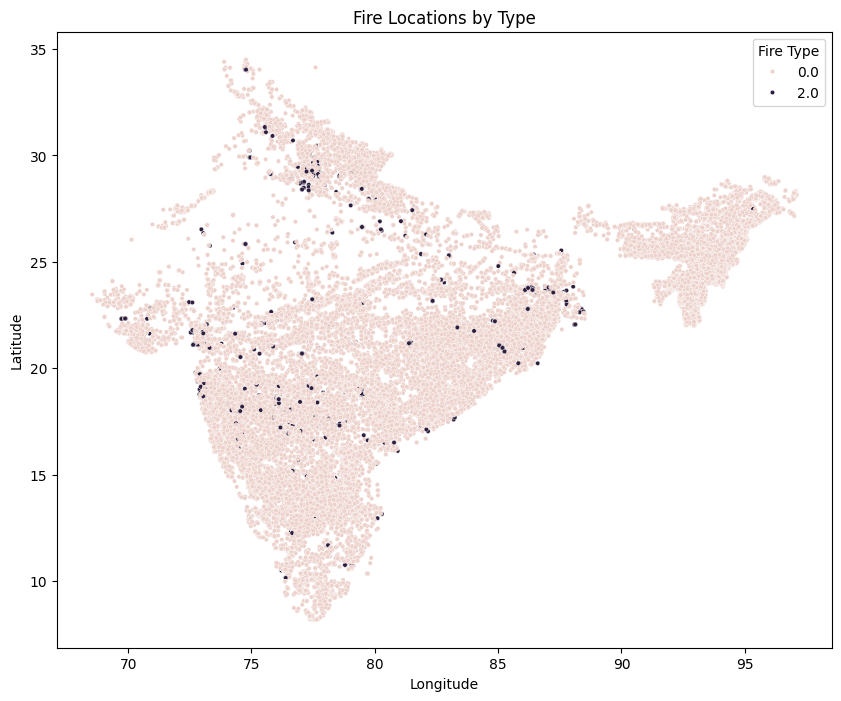

In [40]:
# Scatter plot of 'latitude' vs 'longitude'
plt.figure(figsize=(10, 8))
sns.scatterplot(x='longitude', y='latitude', data=df_clean, hue='type', s=10)
plt.title('Fire Locations by Type')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Fire Type')
plt.show()

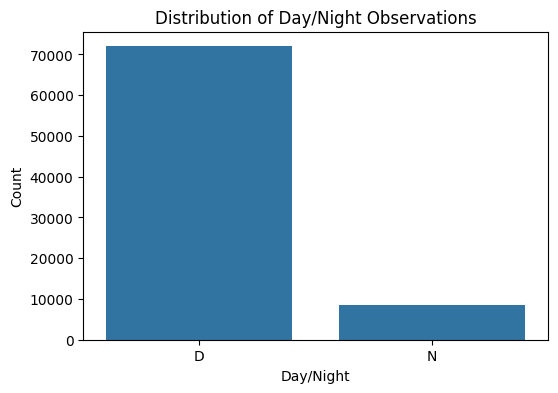

In [41]:
# Count plot for 'daynight'
plt.figure(figsize=(6, 4))
sns.countplot(x='daynight', data=df_clean)
plt.title('Distribution of Day/Night Observations')
plt.xlabel('Day/Night')
plt.ylabel('Count')
plt.show()

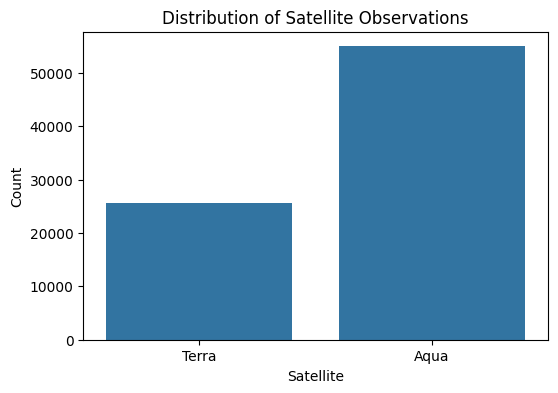

In [42]:
# Count plot for 'Satellite'
plt.figure(figsize=(6, 4))
sns.countplot(x='satellite', data=df_clean)
plt.title('Distribution of Satellite Observations')
plt.xlabel('Satellite')
plt.ylabel('Count')
plt.show()

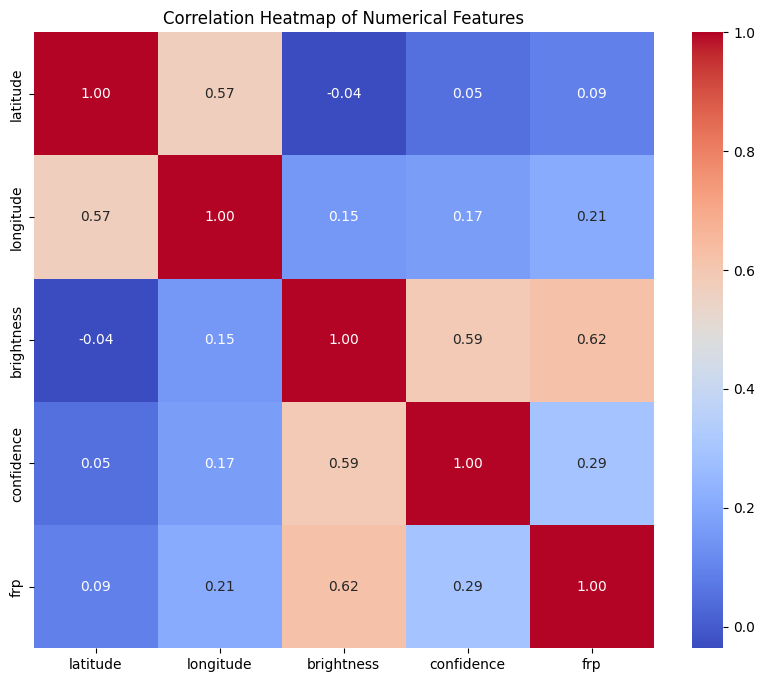

In [44]:
# Heatmap of correlations between numerical features
plt.figure(figsize=(10, 8))
correlation_matrix = df_clean[['latitude', 'longitude', 'brightness', 'confidence', 'frp']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

In [45]:
numerical_cols = df_clean.select_dtypes(include=np.number).columns

In [46]:
numerical_cols

Index(['latitude', 'longitude', 'brightness', 'scan', 'track', 'acq_time',
       'confidence', 'version', 'bright_t31', 'frp', 'type'],
      dtype='object')

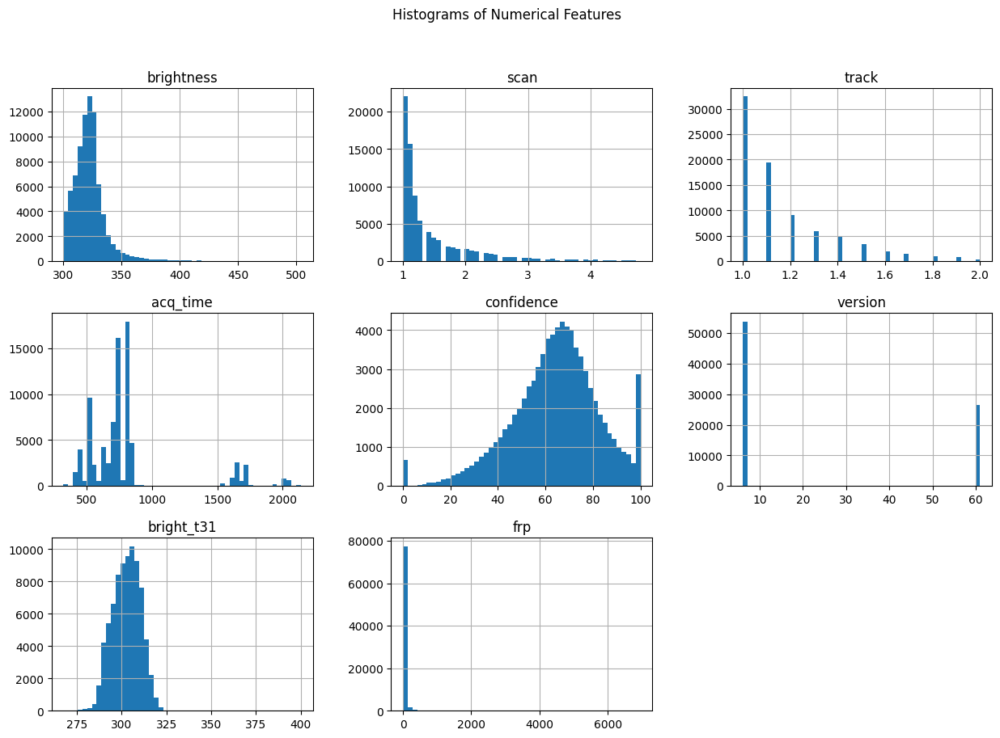

In [48]:
numerical_cols = ['brightness', 'scan', 'track', 'acq_time','confidence', 'version', 'bright_t31', 'frp']
df_clean[numerical_cols].hist(bins=50, figsize=(15, 10))
plt.suptitle('Histograms of Numerical Features')
plt.show()

Analyzing distribution for: brightness


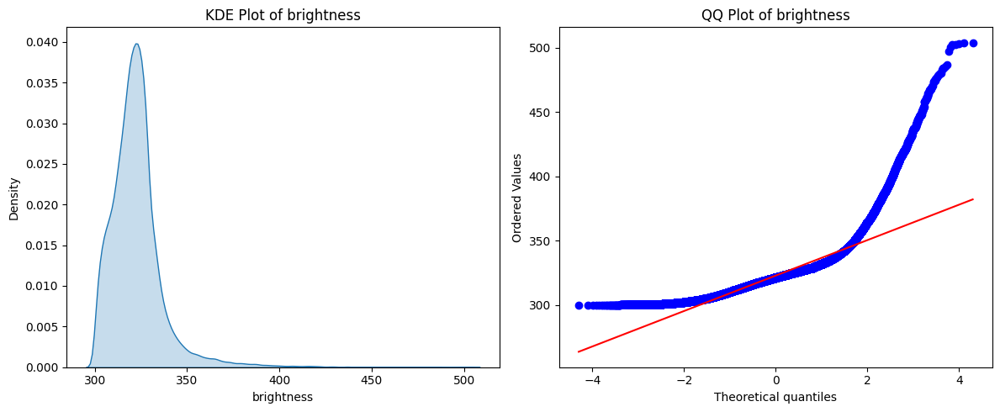

--------------------------------------------------
Analyzing distribution for: confidence


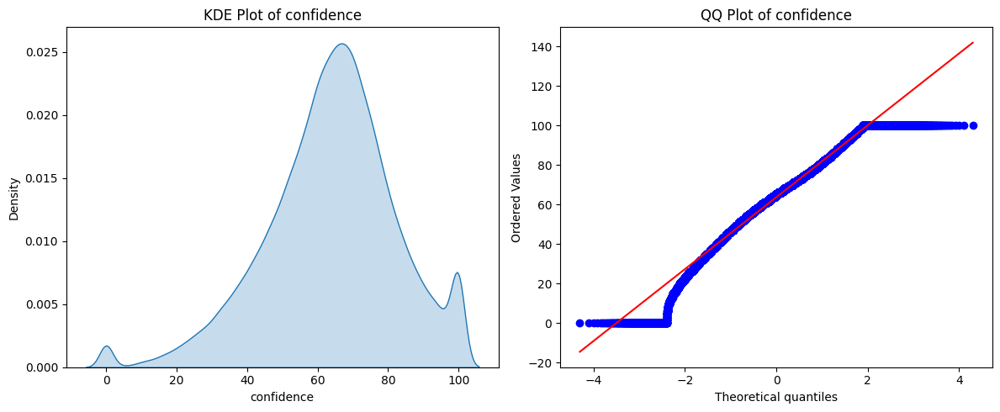

--------------------------------------------------
Analyzing distribution for: frp


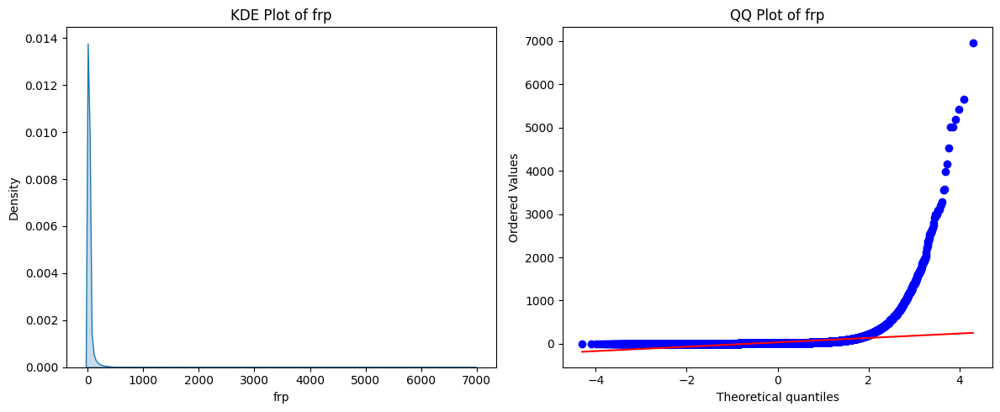

--------------------------------------------------
Analyzing distribution for: bright_t31


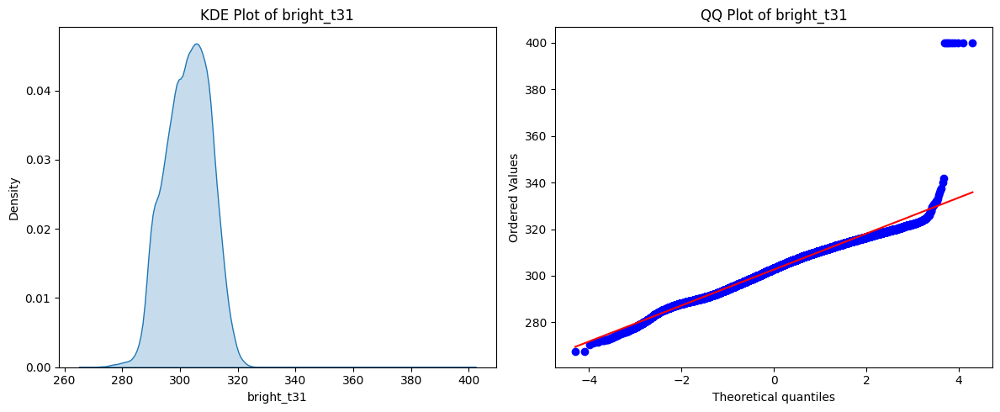

--------------------------------------------------
Analyzing distribution for: scan


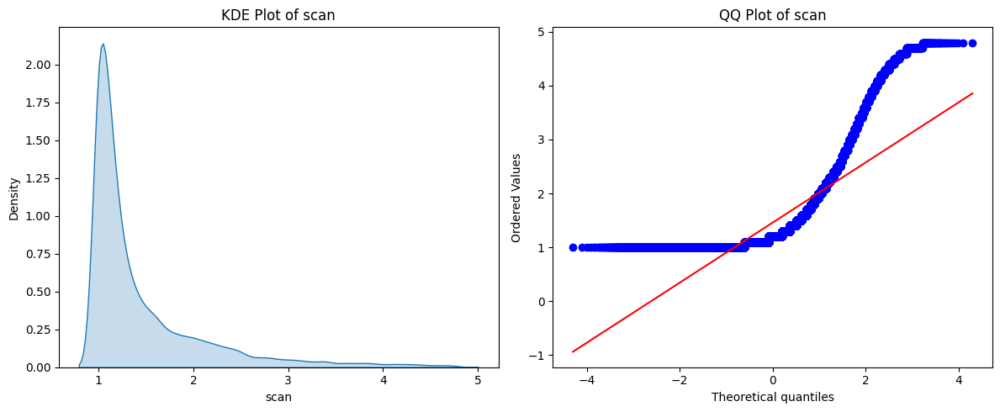

--------------------------------------------------
Analyzing distribution for: track


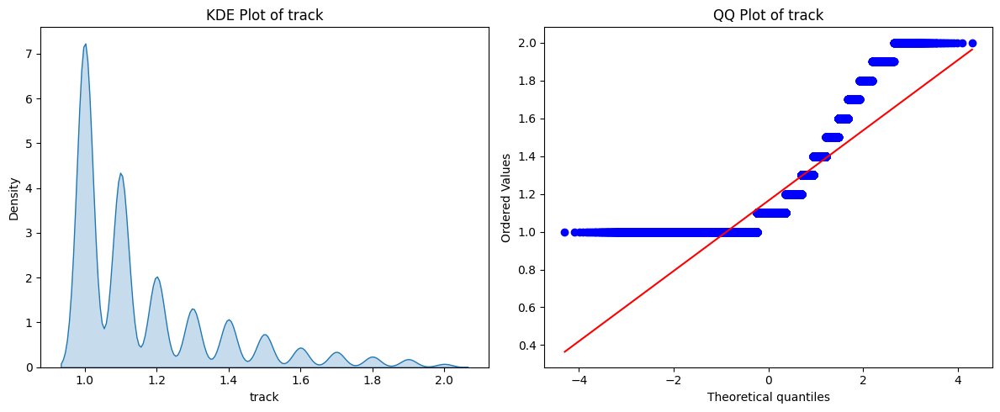

--------------------------------------------------


In [49]:
import statsmodels.api as sm
import scipy.stats as stats

# List of numerical features to check for distribution
numerical_features = ['brightness', 'confidence', 'frp', 'bright_t31', 'scan', 'track']

for feature in numerical_features:
    print(f"Analyzing distribution for: {feature}")

    # KDE Plot
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    sns.kdeplot(df_clean[feature], fill=True)
    plt.title(f'KDE Plot of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Density')

    # QQ Plot
    plt.subplot(1, 2, 2)
    stats.probplot(df_clean[feature], dist="norm", plot=plt)
    plt.title(f'QQ Plot of {feature}')

    plt.tight_layout()
    plt.show()
    print("-" * 50)

In [51]:
# --- Temporal Analysis ---
# Convert 'acq_date' to datetime objects
df_clean['acq_date'] = pd.to_datetime(df['acq_date'])
# Extract temporal features
df_clean['year'] = df['acq_date'].dt.year
df_clean['month'] = df['acq_date'].dt.month
df_clean['day_of_week'] = df['acq_date'].dt.dayofweek # Monday=0, Sunday=6
df_clean['day_of_year'] = df['acq_date'].dt.dayofyear
df_clean['hour'] = df['acq_time'].astype(str).str[:2].astype(int) # Assuming acq_time is HHMM

/tmp/ipython-input-53-2376053273.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_clean, x='month', palette='viridis')


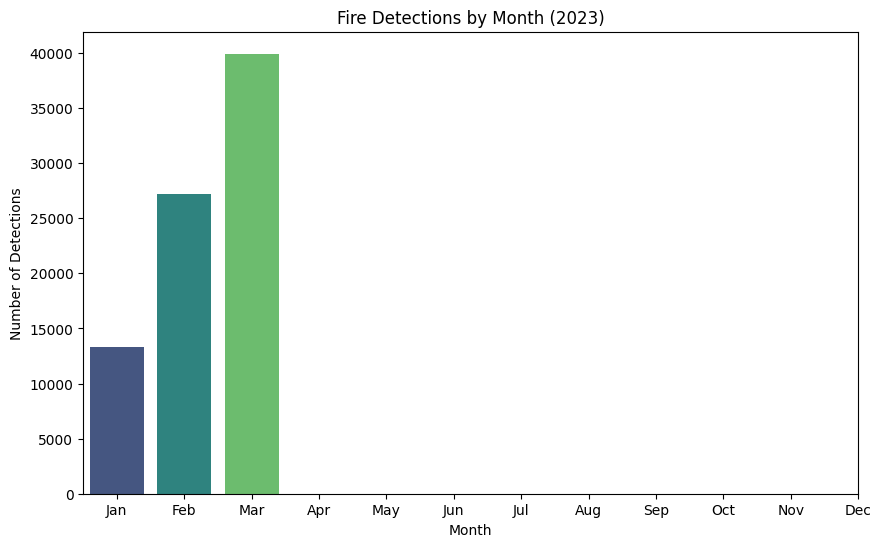

In [53]:
# Visualize fire detections over months
plt.figure(figsize=(10, 6))
sns.countplot(data=df_clean, x='month', palette='viridis')
plt.title('Fire Detections by Month (2023)')
plt.xlabel('Month')
plt.ylabel('Number of Detections')
plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

/tmp/ipython-input-54-2005111989.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_clean, x='day_of_week', palette='viridis')


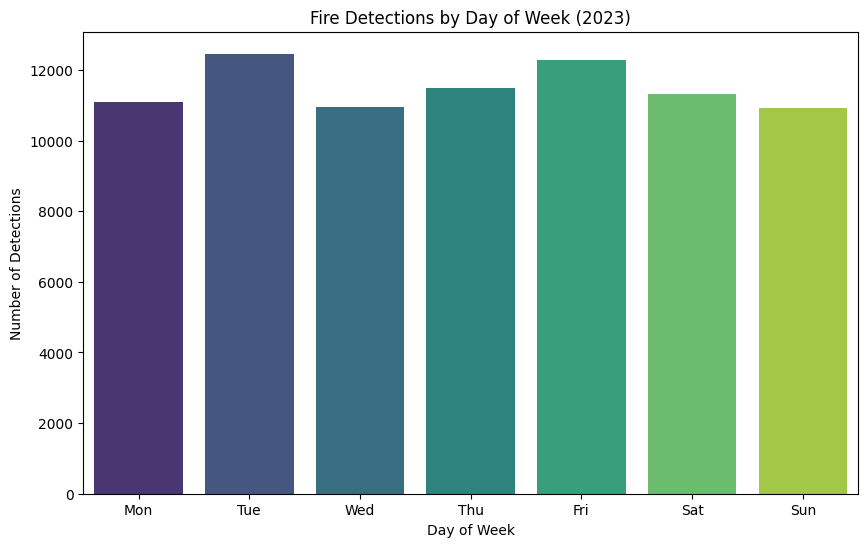

In [54]:
# Visualize fire detections by day of the week
plt.figure(figsize=(10, 6))
sns.countplot(data=df_clean, x='day_of_week', palette='viridis')
plt.title('Fire Detections by Day of Week (2023)')
plt.xlabel('Day of Week')
plt.ylabel('Number of Detections')
plt.xticks(ticks=range(7), labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.show()

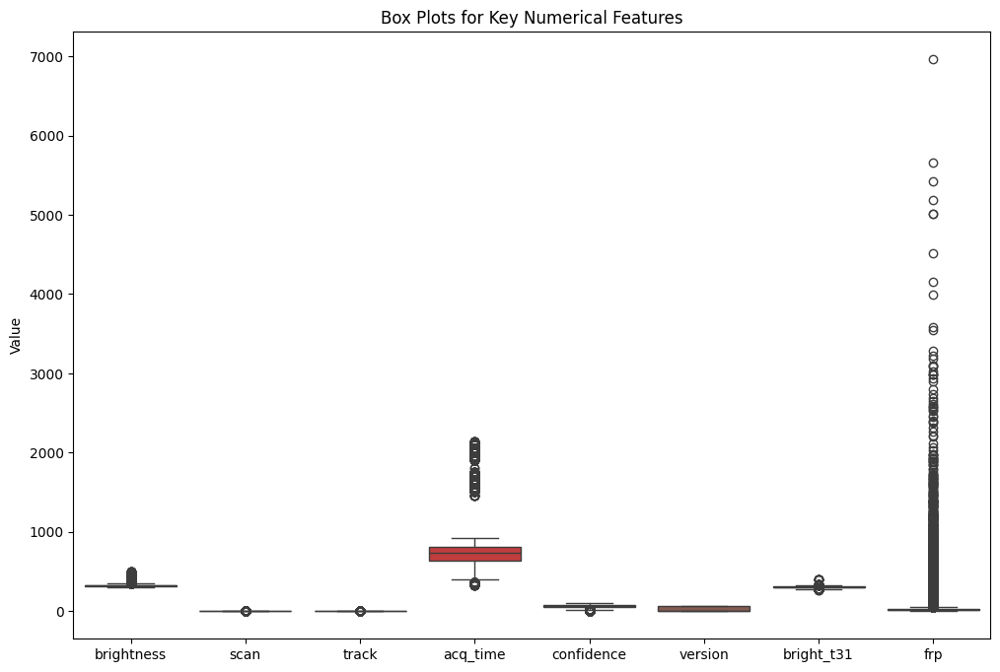

In [55]:
# Visualize outliers using box plots for key numerical features
plt.figure(figsize=(12, 8))
sns.boxplot(data=df_clean[numerical_cols])
plt.title('Box Plots for Key Numerical Features')
plt.ylabel('Value')
plt.show()

In [57]:
def remove_outliers_iqr(df_clean, column):
  Q1 = df_clean[column].quantile(0.25)
  Q3 = df_clean[column].quantile(0.75)
  IQR = Q3 - Q1
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR
  df_cleaned = df_clean[(df_clean[column] >= lower_bound) & (df_clean[column] <= upper_bound)].copy()
  return df_cleaned

# Apply outlier removal to numerical columns
for col in numerical_cols:
  df_clean = remove_outliers_iqr(df_clean, col)

print("Shape after removing outliers:", df_clean.shape)

Shape after removing outliers: (56307, 20)


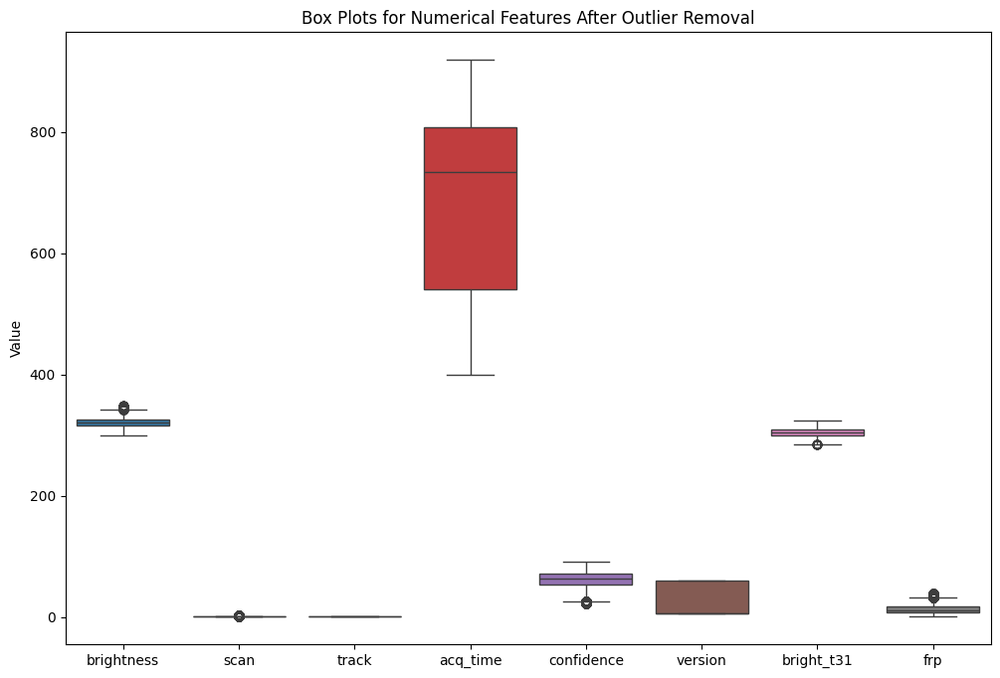

In [58]:
# Visualize box plots after outlier removal
plt.figure(figsize=(12, 8))
sns.boxplot(data=df_clean[numerical_cols])
plt.title('Box Plots for Numerical Features After Outlier Removal')
plt.ylabel('Value')
plt.show()

In [59]:
df_clean.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type,year,month,day_of_week,day_of_year,hour
0,28.0993,96.9983,303.0,1.1,1.1,2021-01-01,409,Terra,MODIS,44.0,6.03,292.6,8.6,D,0.0,2021,1,4,1,40
1,30.0420,79.6492,301.8,1.4,1.2,2021-01-01,547,Terra,MODIS,37.0,6.03,287.4,9.0,D,0.0,2021,1,4,1,54
3,30.0408,80.0501,302.0,1.5,1.2,2021-01-01,547,Terra,MODIS,46.0,6.03,287.7,10.7,D,0.0,2021,1,4,1,54
4,30.6565,78.9668,300.9,1.3,1.1,2021-01-01,547,Terra,MODIS,43.0,6.03,287.6,9.0,D,0.0,2021,1,4,1,54
6,31.4366,76.8988,300.5,1.0,1.0,2021-01-01,547,Terra,MODIS,36.0,6.03,287.2,5.3,D,0.0,2021,1,4,1,54


In [60]:
df_clean.type.value_counts()

,count
type,
0.0,54384
2.0,1923


In [61]:
categorical_cols = df_clean.select_dtypes(include='object').columns

In [62]:
categorical_cols

Index(['satellite', 'instrument', 'daynight'], dtype='object')

In [64]:
# Select categorical columns for encoding
categorical_cols_to_encode = ['daynight', 'satellite', 'instrument']

# Apply One-Hot Encoding
df_encoded = pd.get_dummies(df_clean, columns=categorical_cols_to_encode, drop_first=True)

In [66]:
df_encoded.head(10)

,latitude,longitude,brightness,scan,track,acq_date,acq_time,confidence,version,bright_t31,frp,type,year,month,day_of_week,day_of_year,hour,satellite_Terra
0,28.0993,96.9983,303.0,1.1,1.1,2021-01-01,409,44.0,6.03,292.6,8.6,0.0,2021,1,4,1,40,True
1,30.0420,79.6492,301.8,1.4,1.2,2021-01-01,547,37.0,6.03,287.4,9.0,0.0,2021,1,4,1,54,True
3,30.0408,80.0501,302.0,1.5,1.2,2021-01-01,547,46.0,6.03,287.7,10.7,0.0,2021,1,4,1,54,True
4,30.6565,78.9668,300.9,1.3,1.1,2021-01-01,547,43.0,6.03,287.6,9.0,0.0,2021,1,4,1,54,True
6,31.4366,76.8988,300.5,1.0,1.0,2021-01-01,547,36.0,6.03,287.2,5.3,0.0,2021,1,4,1,54,True
7,29.5369,79.4559,300.3,1.4,1.2,2021-01-01,547,33.0,6.03,289.7,6.3,0.0,2021,1,4,1,54,True
8,30.5665,79.5317,305.9,1.4,1.2,2021-01-01,547,23.0,6.03,292.8,11.4,0.0,2021,1,4,1,54,True
9,31.2932,77.2750,301.4,1.1,1.0,2021-01-01,547,35.0,6.03,290.2,4.3,0.0,2021,1,4,1,54,True
10,29.5395,79.4419,304.5,1.4,1.2,2021-01-01,547,59.0,6.03,290.7,10.1,0.0,2021,1,4,1,54,True
11,30.4853,78.5828,305.3,1.2,1.1,2021-01-01,547,61.0,6.03,291.0,10.9,0.0,2021,1,4,1,54,True


In [67]:
df_encoded.type.value_counts()

,count
type,
0.0,54384
2.0,1923


In [68]:
!pip install folium
import folium

# Create map and sample data
india_map = folium.Map(location=[22.351115, 78.667743], zoom_start=5)
sample_df = df_encoded.sample(n=min(10000, len(df_encoded)), random_state=42)

# Add markers
for _, row in sample_df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        color='red',
        fill=True,
        fill_opacity=0.6,
        popup=f"FRP: {row['frp']:.2f}, Date: {row['acq_date'].strftime('%Y-%m-%d')}"
    ).add_to(india_map)

display(india_map)

Normalize continuous variable

In [69]:
scaler = StandardScaler()
numerical_cols_to_scale = ['brightness', 'scan', 'track', 'confidence', 'bright_t31', 'frp']
df_encoded[numerical_cols_to_scale] = scaler.fit_transform(df_encoded[numerical_cols_to_scale])
df_encoded.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,confidence,version,bright_t31,frp,type,year,month,day_of_week,day_of_year,hour,satellite_Terra
0,28.0993,96.9983,-2.307857,-0.495268,-0.042723,2021-01-01,409,-1.273426,6.03,-1.808808,-0.708303,0.0,2021,1,4,1,40,True
1,30.0420,79.6492,-2.459070,0.394006,0.725343,2021-01-01,547,-1.782634,6.03,-2.585989,-0.656009,0.0,2021,1,4,1,54,True
3,30.0408,80.0501,-2.433868,0.690431,0.725343,2021-01-01,547,-1.127937,6.03,-2.541152,-0.433760,0.0,2021,1,4,1,54,True
4,30.6565,78.9668,-2.572480,0.097582,-0.042723,2021-01-01,547,-1.346170,6.03,-2.556097,-0.656009,0.0,2021,1,4,1,54,True
6,31.4366,76.8988,-2.622885,-0.791693,-0.810788,2021-01-01,547,-1.855378,6.03,-2.615881,-1.139727,0.0,2021,1,4,1,54,True


In [70]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Index: 56307 entries, 0 to 80509
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   latitude         56307 non-null  float64       
 1   longitude        56307 non-null  float64       
 2   brightness       56307 non-null  float64       
 3   scan             56307 non-null  float64       
 4   track            56307 non-null  float64       
 5   acq_date         56307 non-null  datetime64[ns]
 6   acq_time         56307 non-null  int64         
 7   confidence       56307 non-null  float64       
 8   version          56307 non-null  float64       
 9   bright_t31       56307 non-null  float64       
 10  frp              56307 non-null  float64       
 11  type             56307 non-null  float64       
 12  year             56307 non-null  int32         
 13  month            56307 non-null  int32         
 14  day_of_week      56307 non-null  int32     

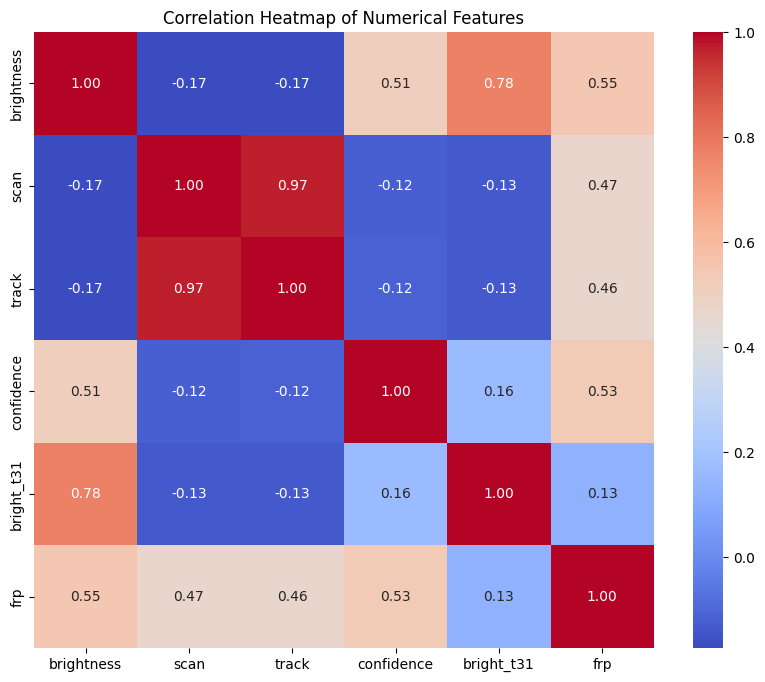

In [71]:
# Heatmap of correlations between numerical features
plt.figure(figsize=(10, 8))
correlation_matrix = df_encoded[['brightness', 'scan', 'track', 'confidence', 'bright_t31', 'frp']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

In [72]:
df_encoded.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,confidence,version,bright_t31,frp,type,year,month,day_of_week,day_of_year,hour,satellite_Terra
0,28.0993,96.9983,-2.307857,-0.495268,-0.042723,2021-01-01,409,-1.273426,6.03,-1.808808,-0.708303,0.0,2021,1,4,1,40,True
1,30.0420,79.6492,-2.459070,0.394006,0.725343,2021-01-01,547,-1.782634,6.03,-2.585989,-0.656009,0.0,2021,1,4,1,54,True
3,30.0408,80.0501,-2.433868,0.690431,0.725343,2021-01-01,547,-1.127937,6.03,-2.541152,-0.433760,0.0,2021,1,4,1,54,True
4,30.6565,78.9668,-2.572480,0.097582,-0.042723,2021-01-01,547,-1.346170,6.03,-2.556097,-0.656009,0.0,2021,1,4,1,54,True
6,31.4366,76.8988,-2.622885,-0.791693,-0.810788,2021-01-01,547,-1.855378,6.03,-2.615881,-1.139727,0.0,2021,1,4,1,54,True


In [73]:
# Separate features (X) and target variable (y)
# Assuming 'type' is the target variable you want to predict
# Drop temporal features if not intended for prediction task that uses 'type' as target
features = ['brightness', 'scan', 'track', 'confidence', 'bright_t31', 'frp']
target = 'type'

X = df_encoded[features]
y = df_encoded[target]


In [74]:
X

,brightness,scan,track,confidence,bright_t31,frp
0,-2.307857,-0.495268,-0.042723,-1.273426,-1.808808,-0.708303
1,-2.459070,0.394006,0.725343,-1.782634,-2.585989,-0.656009
3,-2.433868,0.690431,0.725343,-1.127937,-2.541152,-0.433760
4,-2.572480,0.097582,-0.042723,-1.346170,-2.556097,-0.656009
6,-2.622885,-0.791693,-0.810788,-1.855378,-2.615881,-1.139727
...,...,...,...,...,...,...
80503,0.590400,-0.791693,-0.810788,0.472433,-0.448742,0.416015
80505,0.212366,-0.791693,-0.810788,0.763409,-0.299284,-0.289952
80506,-0.430291,-0.791693,-0.810788,-1.273426,-0.478633,-0.721377
80508,-0.190869,-0.791693,-0.810788,-0.545984,-0.657983,-0.629862


In [76]:
y



,type
0,0.0
1,0.0
3,0.0
4,0.0
6,0.0
...,...
80503,0.0
80505,0.0
80506,0.0
80508,0.0


In [77]:
!pip install -U imbalanced-learn
from imblearn.over_sampling import SMOTE

In [78]:
# Initialize SMOTE #week 2
smote = SMOTE(random_state=42)

# Apply SMOTE to the training data
X_resampled, y_resampled = smote.fit_resample(X, y)

# Check the distribution of the target variable after resampling
print("Distribution of target variable after SMOTE:")
print(y_resampled.value_counts())

Distribution of target variable after SMOTE:
type
0.0    54384
2.0    54384
Name: count, dtype: int64
